# Mask Detector


## Import Packages

In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
#from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import os

import sys
!{sys.executable} -m pip install imutils
!{sys.executable} -m pip install easydict

from imutils import paths
import easydict

## Argument Parser

Argsparse is one of many ways to pass arguments to a script in python from the terminal

In [35]:
##ap = argparse.ArgumentParser()
##ap.add_argument("-d", "--dataset", required=True,
##	help="path to input dataset")
##ap.add_argument("-p", "--plot", type=str, default="plot.png",
##	help="path to output loss/accuracy plot")
##ap.add_argument("-m", "--model", type=str,
##	default="mask_detector.model",
##	help="path to output face mask detector model")
##args = vars(ap.parse_args())

args = easydict.EasyDict({
    "dataset": 'utility/data',
    "input_image": 'utility/bernardo_mask.jpg',
    "input_image02": 'utility/two_person_image.jpeg',
    "input_image03": 'utility/no_mask_test.jpg',
    "input_image_katie":'utility/katie_mask.jpg',
    "input_image_elizabeth":'utility/elizabeth_mask.jpg',
    "input_image_daniel":'utility/daniel_mask.jpg',
    "face_deploy": 'utility/face_detector/deploy.prototxt',
    "face_caffe": 'utility/face_detector/res10_300x300_ssd_iter_140000.caffemodel',
    "confidence": 0.5,
    "output": 'mask_detector.model'
})

## Learning Rate, Epochs, and Batch Size

In [4]:
learning_rate = 1e-4
epochs = 20
batch = 32

## Data Preprocessing

### Assigning Labels to the Data

In [5]:
print("[INFO] loading images...")

#get the image path
imagePaths = list(paths.list_images(args["dataset"]))

#initialize array for the image data
data = []

#initialize array for the labels
labels = []

for imagePath in imagePaths:
    label = imagePath.split(os.path.sep)[-2]
    
    image = load_img(imagePath, target_size = (224, 224))
    image = img_to_array(image)
    image = preprocess_input(image)
    
    data.append(image)
    labels.append(label)

data = np.array(data, dtype="float32")
labels = np.array(labels)
 
#Perform one hot encoding
#A one hot encoding is a representation of categorical variables as binary vectors
#The first requires that the categorical values be mapped to integer values
#then, each integer value is represented as a binary vector that is all zero values excpet the index of the integer,
#which is marked with a 1.
lb = LabelBinarizer()
labels = lb.fit_transform(labels)
labels = to_categorical(labels)

numZeros = 0
numOnes = 0

for x in labels:
    for y in x:
        if y == 0:
            numZeros = numZeros + 1
        elif y == 1:
            numOnes = numOnes +1
    
print(labels)
print("")
print(labels.shape)
print("")
print("There are " + str(labels.size) + " images in our dataset")
print("")
print(str(numZeros) + " samples have the label 0")
print("")
print(str(numOnes) + " samples have the label 1")

[INFO] loading images...


/opt/anaconda3/envs/tf/lib/python3.7/site-packages/PIL/Image.py:961: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[[1. 0.]
 [1. 0.]
 [1. 0.]
 ...
 [0. 1.]
 [0. 1.]
 [0. 1.]]

(3833, 2)

There are 7666 images in our dataset

3833 samples have the label 0

3833 samples have the label 1


### Splitting the Data

In [6]:
#The train_test_split will split arrays or matrices into random train and test subsets
X_train, X_test, y_train, y_test = train_test_split(
    data, labels, test_size = 0.33, stratify = labels, random_state = 42)

### Data Augmentation

In [7]:
#Use the ImageDataGenerator class to generate batches of tensor image data with real-time data sigmentation
#The data will be looped over (in batches)

data_augmentation = ImageDataGenerator(
    	rotation_range=20,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
	fill_mode="nearest"
)

## Modeling

MobileNetV2 is a family of general purpose computer vision neural networks designed to support classification. 

### Sub-Models

In [8]:
#base model
baseModel = MobileNetV2(
    weights="imagenet", 
    include_top = False, 
    input_tensor = Input(shape = (224, 224, 3))
)

#head model
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)

#model
model = Model(inputs = baseModel.input, outputs=headModel)

for layer in baseModel.layers:
	layer.trainable = False

/opt/anaconda3/envs/tf/lib/python3.7/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


### Compile Models

In [9]:
print("[INFO] compiling model...")
opt = Adam(lr = learning_rate, decay = learning_rate / epochs)
model.compile(loss = "binary_crossentropy", optimizer = opt,
	metrics = ["accuracy"])

[INFO] compiling model...


### Training

In [10]:
print("[INFO] training head...")
H = model.fit(
	data_augmentation.flow(X_train, y_train, batch_size = batch),
	steps_per_epoch = len(X_train) // batch,
	validation_data = (X_test, y_test),
	validation_steps = len(X_test) // batch,
	epochs=epochs)

[INFO] training head...
Train for 80 steps, validate on 1265 samples
Epoch 1/20
80/80 [==============================] - 412s 5s/step - loss: 0.5929 - accuracy: 0.6956 - val_loss: 0.3567 - val_accuracy: 0.8446
Epoch 2/20
80/80 [==============================] - 404s 5s/step - loss: 0.3222 - accuracy: 0.8651 - val_loss: 0.3207 - val_accuracy: 0.8646
Epoch 3/20
80/80 [==============================] - 429s 5s/step - loss: 0.2421 - accuracy: 0.9117 - val_loss: 0.3532 - val_accuracy: 0.8558
Epoch 4/20
80/80 [==============================] - 468s 6s/step - loss: 0.2153 - accuracy: 0.9215 - val_loss: 0.3157 - val_accuracy: 0.8758
Epoch 5/20
80/80 [==============================] - 569s 7s/step - loss: 0.1914 - accuracy: 0.9278 - val_loss: 0.2487 - val_accuracy: 0.8990
Epoch 6/20
80/80 [==============================] - 604s 8s/step - loss: 0.1642 - accuracy: 0.9405 - val_loss: 0.3270 - val_accuracy: 0.8774
Epoch 7/20
80/80 [==============================] - 478s 6s/step - loss: 0.1549 - acc

### Testing

In [11]:
print("[INFO] evaluating neural network...")
predictions = model.predict(X_test, batch_size = batch)
predictions = np.argmax(predictions, axis = 1)

print(classification_report(y_test.argmax(axis = 1), predictions, target_names = lb.classes_))

[INFO] evaluating neural network...
              precision    recall  f1-score   support

   with_mask       0.99      0.83      0.90       632
without_mask       0.85      0.99      0.92       633

    accuracy                           0.91      1265
   macro avg       0.92      0.91      0.91      1265
weighted avg       0.92      0.91      0.91      1265



### Plotting

<Figure size 432x288 with 0 Axes>

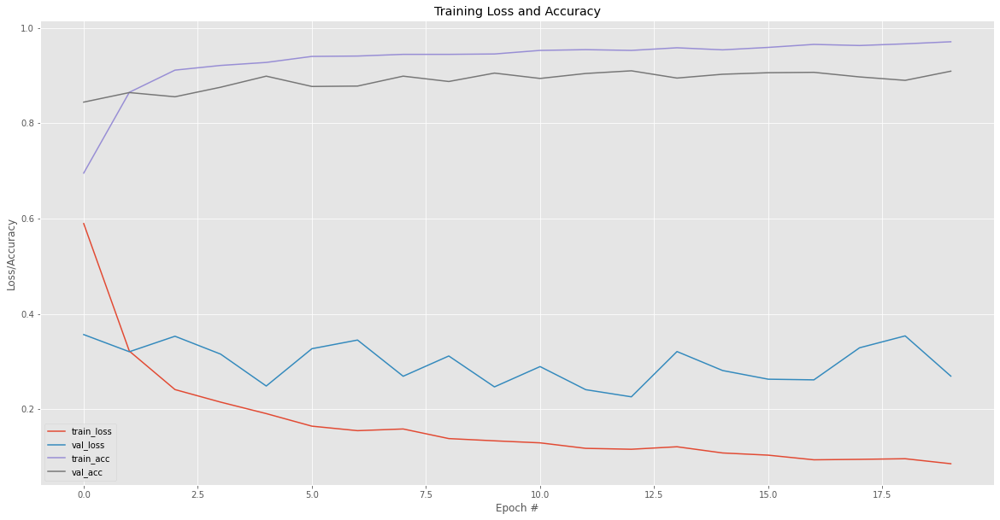

In [12]:
N = epochs
plt.style.use("ggplot")
plt.figure()
plt.figure(figsize=(20,10))
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")

### Test on Bernardo

#### Load Face Detector

In [13]:
import cv2
from IPython.display import Image

prototxtPath = args["face_deploy"]
weightsPath = args["face_caffe"]
net = cv2.dnn.readNet(prototxtPath, weightsPath)

#### Load Image

[INFO] computing face detections...


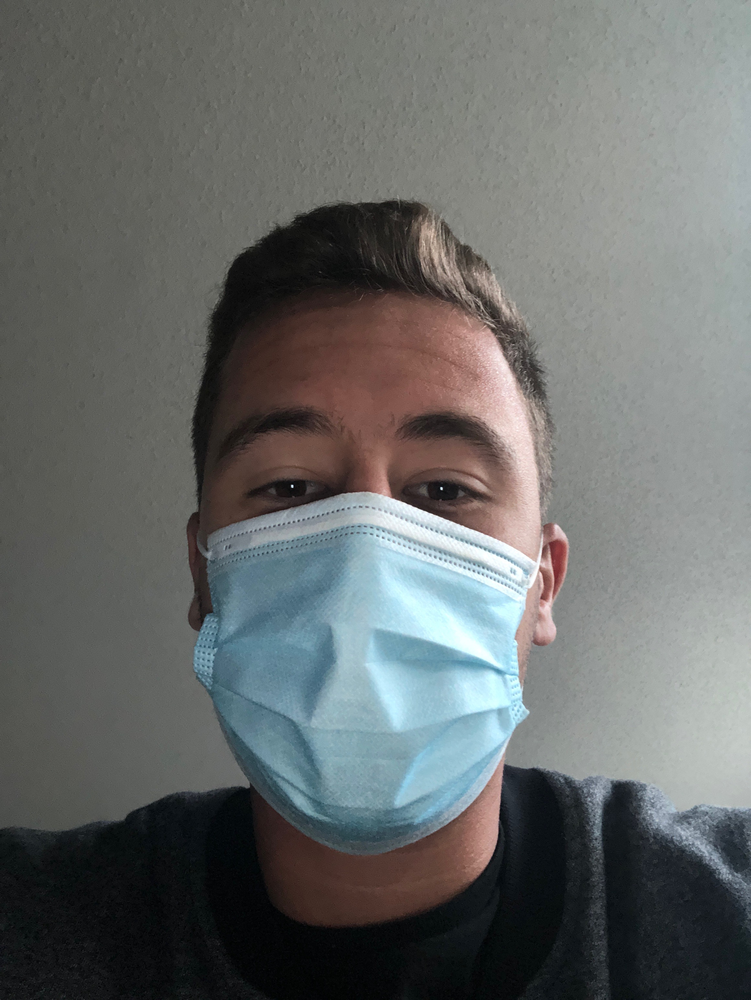

In [14]:
import matplotlib.image as mpimg
#bernardo_img = cv2.imread('utility/bernardo_mask.jpg')
bernardo_img = mpimg.imread('utility/bernardo_mask.jpg')
orig = bernardo_img.copy()
(h,w) = bernardo_img.shape[:2]

#construct blob from image
blob = cv2.dnn.blobFromImage(bernardo_img, 1.0, (300, 300),
		(104.0, 177.0, 123.0))

#pass the blob through the network
print("[INFO] computing face detections...")
net.setInput(blob)
detections = net.forward()

Image(filename=args["input_image"], width = 600, height = 300)

#### Obtain Face Detections

In [15]:
for i in range(0, detections.shape[2]):
		# extract the confidence (i.e., probability) associated with
		# the detection
		confidence = detections[0, 0, i, 2]

		# filter out weak detections by ensuring the confidence is
		# greater than the minimum confidence
		if confidence > args["confidence"]:
			# compute the (x, y)-coordinates of the bounding box for
			# the object
			box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
			(startX, startY, endX, endY) = box.astype("int")

			# ensure the bounding boxes fall within the dimensions of
			# the frame
			(startX, startY) = (max(0, startX), max(0, startY))
			(endX, endY) = (min(w - 1, endX), min(h - 1, endY))

			# extract the face ROI, convert it from BGR to RGB channel
			# ordering, resize it to 224x224, and preprocess it
			face = bernardo_img[startY:endY, startX:endX]
			face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
			face = cv2.resize(face, (224, 224))
			face = img_to_array(face)
			face = preprocess_input(face)
			face = np.expand_dims(face, axis=0)

			# pass the face through the model to determine if the face
			# has a mask or not
			(mask, withoutMask) = model.predict(face)[0]

			# determine the class label and color we'll use to draw
			# the bounding box and text
			label = "Mask" if mask > withoutMask else "No Mask"
			color = (0, 255, 0) if label == "Mask" else (0, 0, 255)

			# include the probability in the label
			label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

			# display the label and bounding box rectangle on the output
			# frame
			cv2.putText(bernardo_img, label, (startX, startY - 10),
				cv2.FONT_HERSHEY_SIMPLEX, 1.0, color, 2)
			cv2.rectangle(bernardo_img, (startX, startY), (endX, endY), color, 2)

#### Output

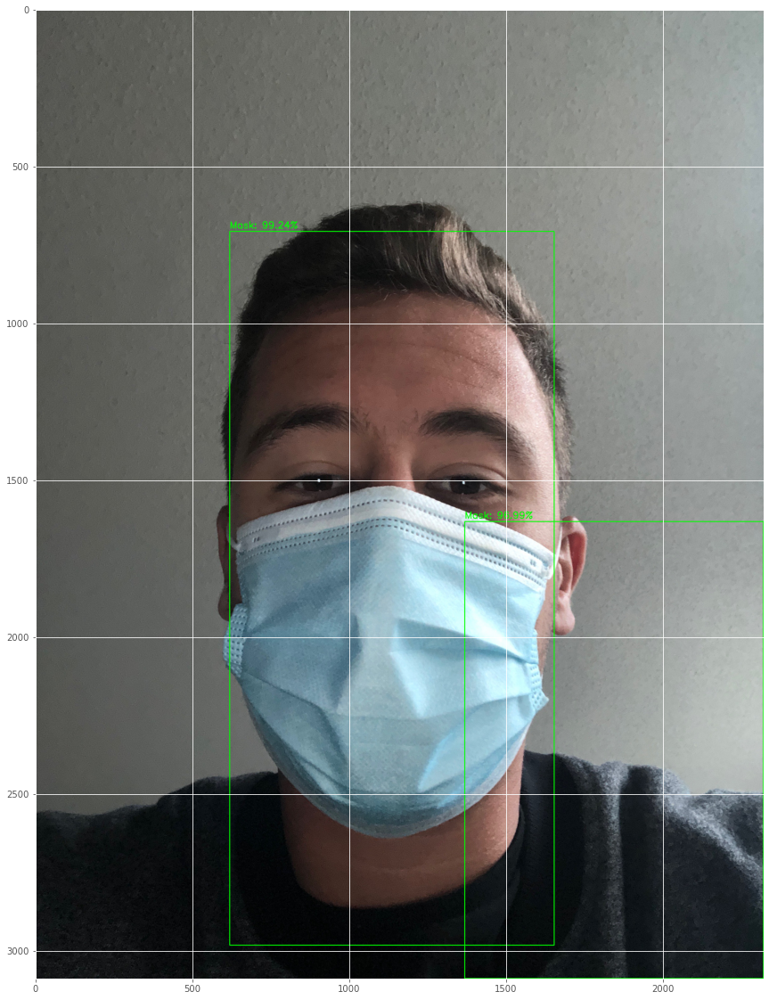

In [16]:
# show the output image

""""
name = "output"
cv2.namedWindow(name, cv2.WINDOW_NORMAL)
cv2.resizeWindow(name, 500, 500)
cv2.imshow(name, bernardo_img)
cv2.waitKey(0)
"""
plt.figure(figsize=(40,20))
imgplot = plt.imshow(bernardo_img)
plt.show()

### Test on Two Person Image

#### Load Image

[INFO] computing face detections...


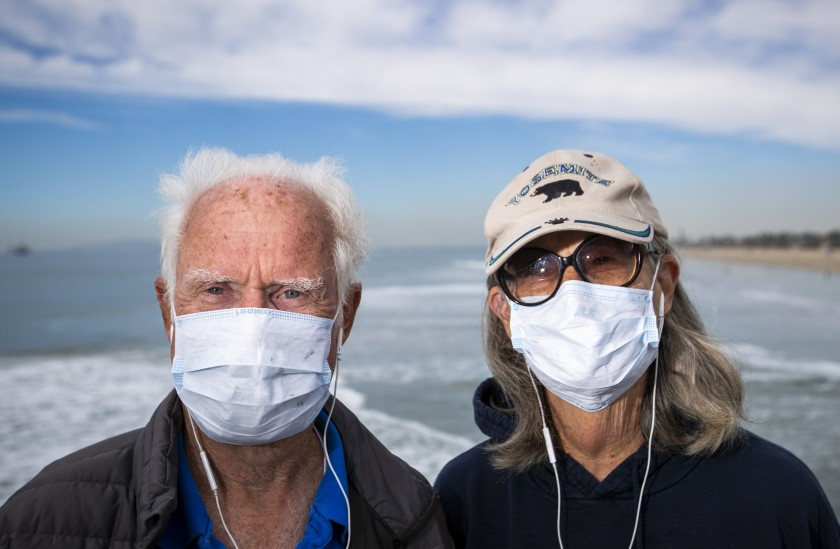

In [17]:
#bernardo_img = cv2.imread('utility/bernardo_mask.jpg')
two_person_img = mpimg.imread('utility/two_person_image.jpeg')
orig = two_person_img.copy()
(h,w) = two_person_img.shape[:2]

#construct blob from image
blob02 = cv2.dnn.blobFromImage(two_person_img, 1.0, (300, 300),
		(104.0, 177.0, 123.0))

#pass the blob through the network
print("[INFO] computing face detections...")
net.setInput(blob02)
detections = net.forward()

Image(filename=args["input_image02"], width = 600, height = 300)

#### Obtain Face Detections

In [18]:
for i in range(0, detections.shape[2]):
		# extract the confidence (i.e., probability) associated with
		# the detection
		confidence = detections[0, 0, i, 2]

		# filter out weak detections by ensuring the confidence is
		# greater than the minimum confidence
		if confidence > args["confidence"]:
			# compute the (x, y)-coordinates of the bounding box for
			# the object
			box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
			(startX, startY, endX, endY) = box.astype("int")

			# ensure the bounding boxes fall within the dimensions of
			# the frame
			(startX, startY) = (max(0, startX), max(0, startY))
			(endX, endY) = (min(w - 1, endX), min(h - 1, endY))

			# extract the face ROI, convert it from BGR to RGB channel
			# ordering, resize it to 224x224, and preprocess it
			face = two_person_img[startY:endY, startX:endX]
			face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
			face = cv2.resize(face, (224, 224))
			face = img_to_array(face)
			face = preprocess_input(face)
			face = np.expand_dims(face, axis=0)

			# pass the face through the model to determine if the face
			# has a mask or not
			(mask, withoutMask) = model.predict(face)[0]

			# determine the class label and color we'll use to draw
			# the bounding box and text
			label = "Mask" if mask > withoutMask else "No Mask"
			color = (0, 255, 0) if label == "Mask" else (0, 0, 255)

			# include the probability in the label
			label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

			# display the label and bounding box rectangle on the output
			# frame
			cv2.putText(two_person_img, label, (startX, startY - 10),
				cv2.FONT_HERSHEY_SIMPLEX, 1.0, color, 2)
			cv2.rectangle(two_person_img, (startX, startY), (endX, endY), color, 2)

#### Output

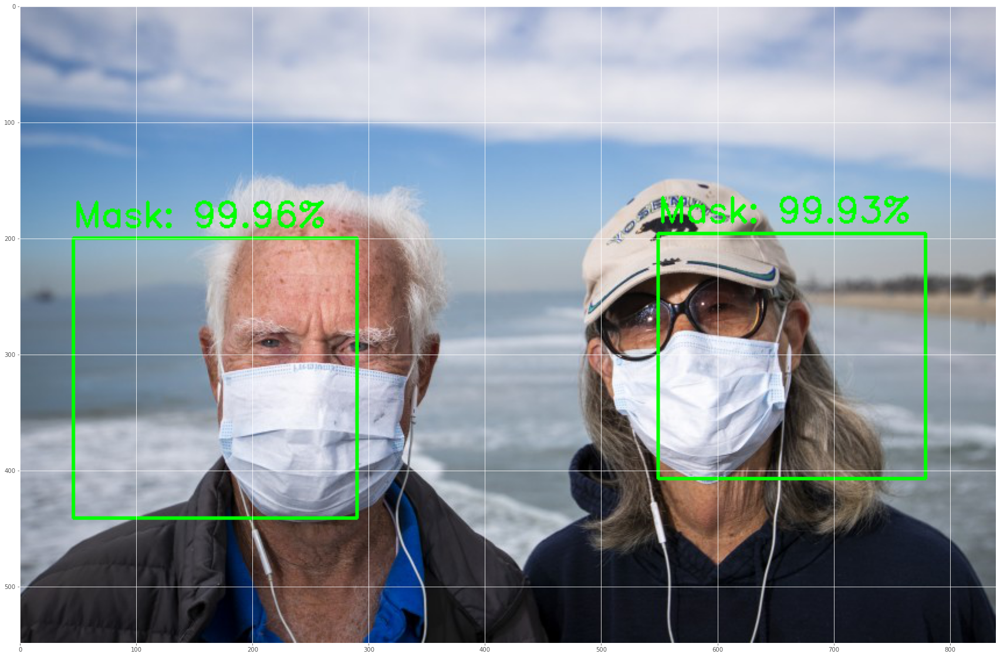

In [19]:
plt.figure(figsize=(40,20))
imgplot = plt.imshow(two_person_img)
plt.show()

### Test on No Mask Image

#### Load Image

[INFO] computing face detections...


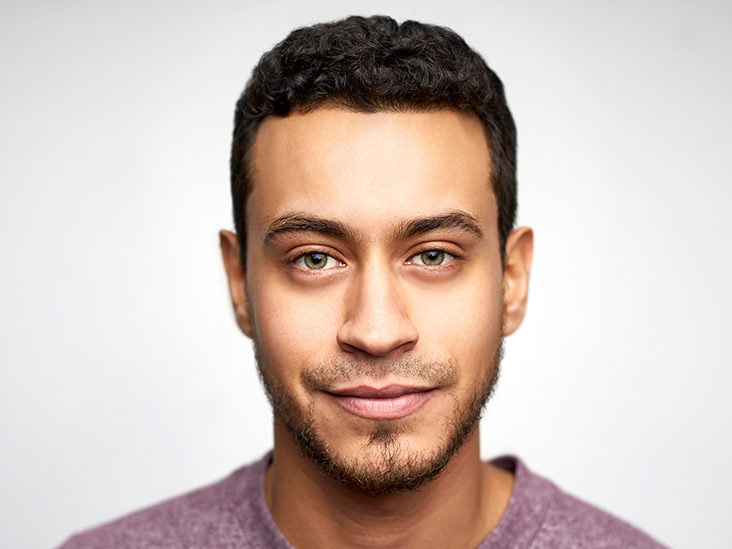

In [20]:
no_mask_img = mpimg.imread('utility/no_mask_test.jpg')
orig = two_person_img.copy()
(h,w) = two_person_img.shape[:2]

#construct blob from image
blob03 = cv2.dnn.blobFromImage(no_mask_img, 1.0, (300, 300),
		(104.0, 177.0, 123.0))

#pass the blob through the network
print("[INFO] computing face detections...")
net.setInput(blob03)
detections = net.forward()

Image(filename=args["input_image03"], width = 600, height = 300)

#### Obtain Face Detections

In [21]:
for i in range(0, detections.shape[2]):
		# extract the confidence (i.e., probability) associated with
		# the detection
		confidence = detections[0, 0, i, 2]

		# filter out weak detections by ensuring the confidence is
		# greater than the minimum confidence
		if confidence > args["confidence"]:
			# compute the (x, y)-coordinates of the bounding box for
			# the object
			box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
			(startX, startY, endX, endY) = box.astype("int")

			# ensure the bounding boxes fall within the dimensions of
			# the frame
			(startX, startY) = (max(0, startX), max(0, startY))
			(endX, endY) = (min(w - 1, endX), min(h - 1, endY))

			# extract the face ROI, convert it from BGR to RGB channel
			# ordering, resize it to 224x224, and preprocess it
			face = no_mask_img[startY:endY, startX:endX]
			face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
			face = cv2.resize(face, (224, 224))
			face = img_to_array(face)
			face = preprocess_input(face)
			face = np.expand_dims(face, axis=0)

			# pass the face through the model to determine if the face
			# has a mask or not
			(mask, withoutMask) = model.predict(face)[0]

			# determine the class label and color we'll use to draw
			# the bounding box and text
			label = "Mask" if mask > withoutMask else "No Mask"
			color = (0, 255, 0) if label == "Mask" else (0, 0, 255)

			# include the probability in the label
			label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

			# display the label and bounding box rectangle on the output
			# frame
			cv2.putText(no_mask_img, label, (startX, startY - 10),
				cv2.FONT_HERSHEY_SIMPLEX, 1.0, color, 2)
			cv2.rectangle(no_mask_img, (startX, startY), (endX, endY), color, 2)

#### Output

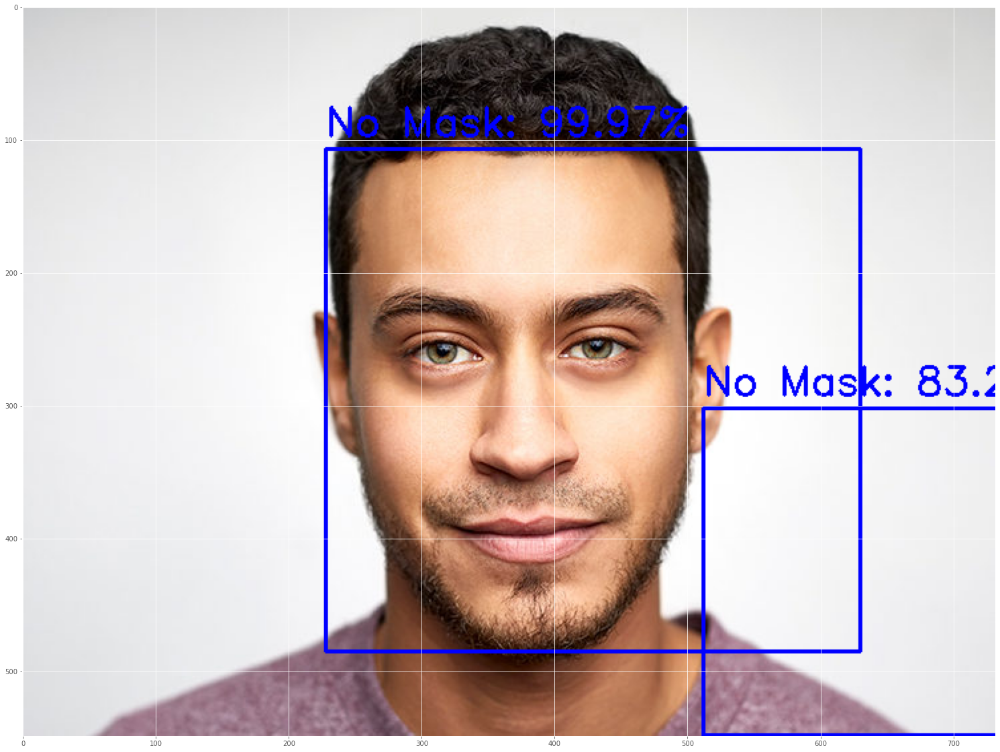

In [22]:
plt.figure(figsize=(40,20))
imgplot = plt.imshow(no_mask_img)
plt.show()

### Test with Katie

#### Load Image

[INFO] computing face detections...


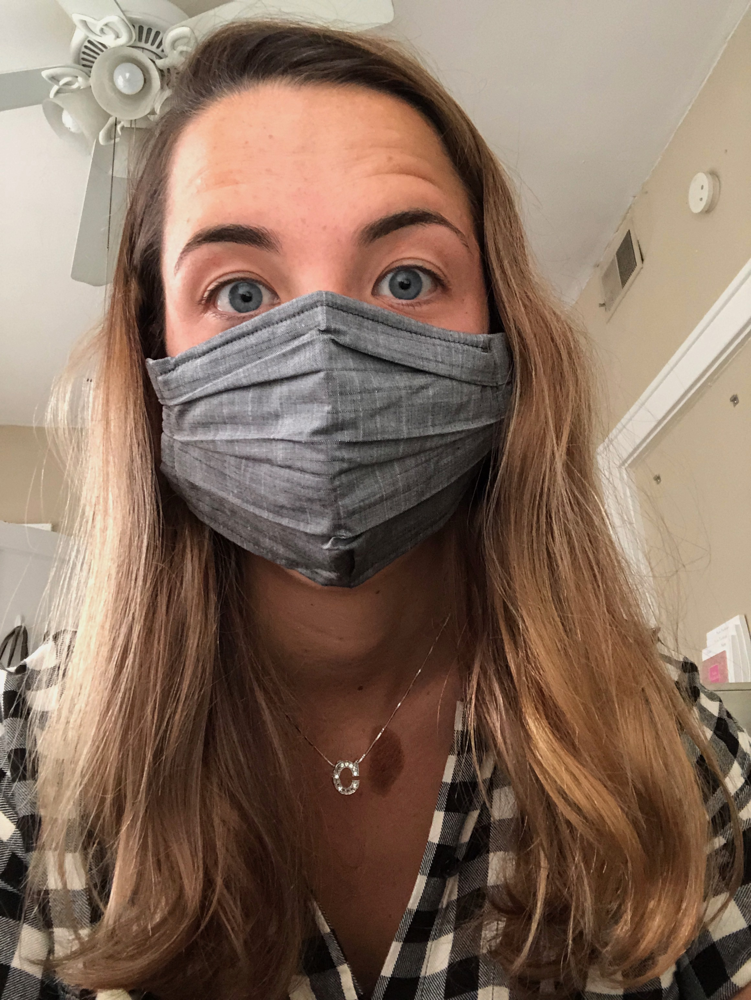

In [23]:
katie_mask = mpimg.imread('utility/katie_mask.jpg')
orig = katie_mask.copy()
(h,w) = katie_mask.shape[:2]

#construct blob from image
blob04 = cv2.dnn.blobFromImage(katie_mask, 1.0, (300, 300),
		(104.0, 177.0, 123.0))

#pass the blob through the network
print("[INFO] computing face detections...")
net.setInput(blob04)
detections = net.forward()

Image(filename=args["input_image_katie"], width = 600, height = 300)

#### Obtain Face Detections

In [24]:
for i in range(0, detections.shape[2]):
		# extract the confidence (i.e., probability) associated with
		# the detection
		confidence = detections[0, 0, i, 2]

		# filter out weak detections by ensuring the confidence is
		# greater than the minimum confidence
		if confidence > args["confidence"]:
			# compute the (x, y)-coordinates of the bounding box for
			# the object
			box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
			(startX, startY, endX, endY) = box.astype("int")

			# ensure the bounding boxes fall within the dimensions of
			# the frame
			(startX, startY) = (max(0, startX), max(0, startY))
			(endX, endY) = (min(w - 1, endX), min(h - 1, endY))

			# extract the face ROI, convert it from BGR to RGB channel
			# ordering, resize it to 224x224, and preprocess it
			face = katie_mask[startY:endY, startX:endX]
			face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
			face = cv2.resize(face, (224, 224))
			face = img_to_array(face)
			face = preprocess_input(face)
			face = np.expand_dims(face, axis=0)

			# pass the face through the model to determine if the face
			# has a mask or not
			(mask, withoutMask) = model.predict(face)[0]

			# determine the class label and color we'll use to draw
			# the bounding box and text
			label = "Mask" if mask > withoutMask else "No Mask"
			color = (0, 255, 0) if label == "Mask" else (0, 0, 255)

			# include the probability in the label
			label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

			# display the label and bounding box rectangle on the output
			# frame
			cv2.putText(katie_mask, label, (endX, endY - 10),
				cv2.FONT_HERSHEY_SIMPLEX, 2.0, color, 2)
			cv2.rectangle(katie_mask, (startX, startY), (endX, endY), color, 2)

#### Output

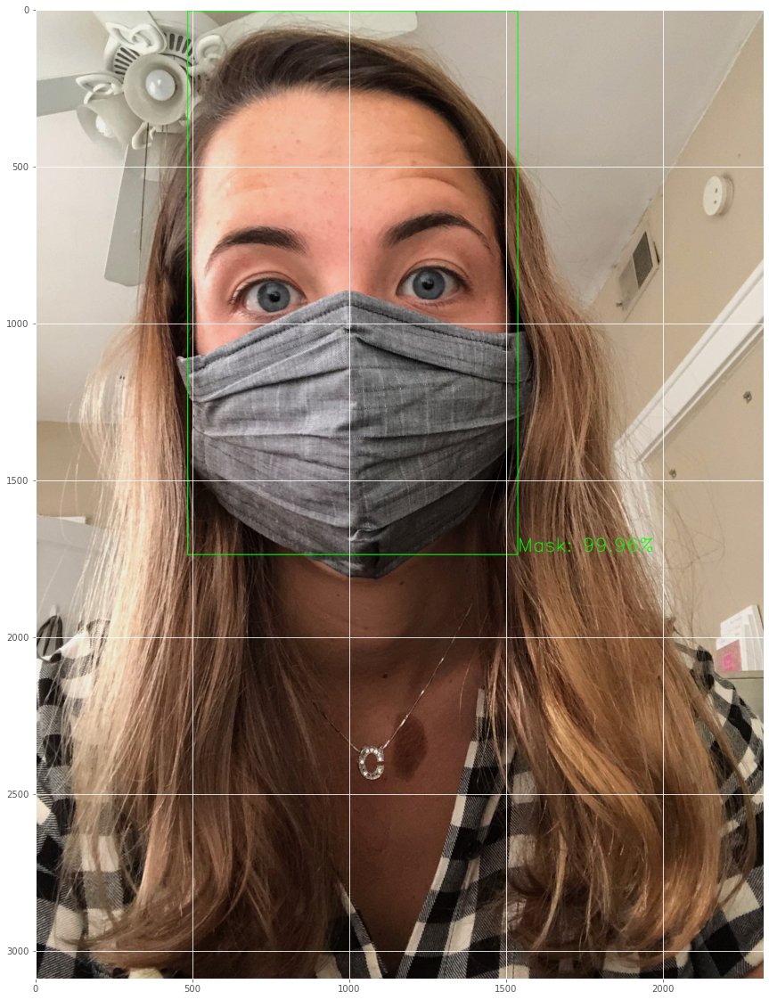

In [25]:
plt.figure(figsize=(40,20))
imgplot = plt.imshow(katie_mask)
plt.show()

#### Test with Elizabeth

#### Load Image

[INFO] computing face detections...


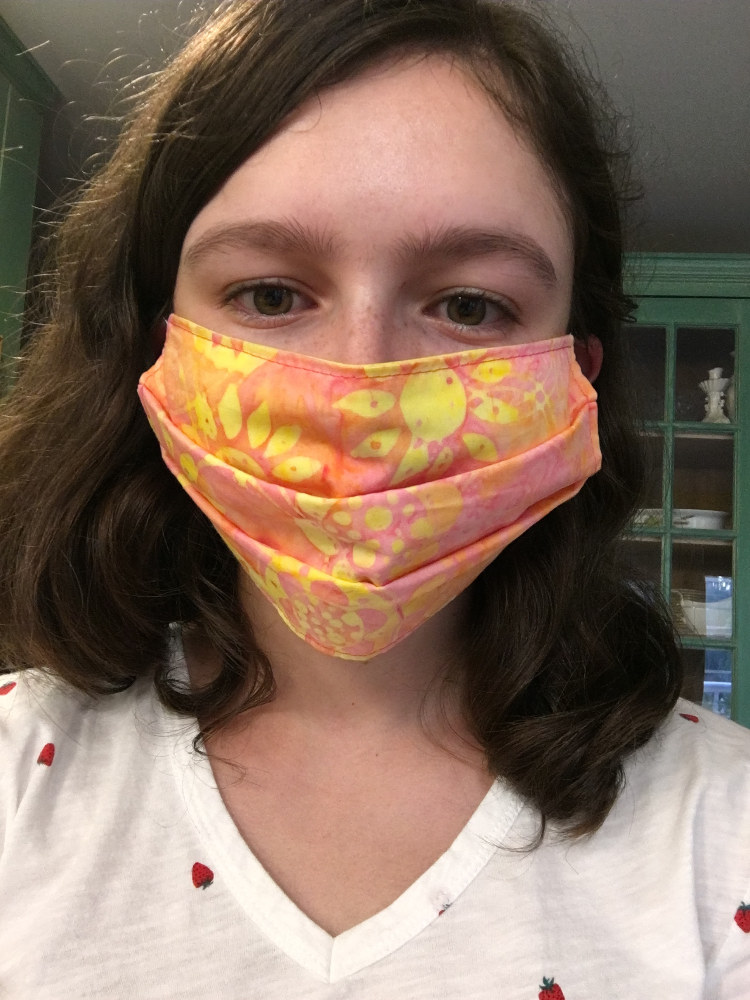

In [26]:
elizabeth_mask = mpimg.imread('utility/elizabeth_mask.jpg')
orig = elizabeth_mask.copy()
(h,w) = elizabeth_mask.shape[:2]

#construct blob from image
blob05 = cv2.dnn.blobFromImage(elizabeth_mask, 1.0, (300, 300),
		(104.0, 177.0, 123.0))

#pass the blob through the network
print("[INFO] computing face detections...")
net.setInput(blob05)
detections = net.forward()

Image(filename=args["input_image_elizabeth"], width = 600, height = 300)

#### Obtain Face Detections

In [27]:
for i in range(0, detections.shape[2]):
		# extract the confidence (i.e., probability) associated with
		# the detection
		confidence = detections[0, 0, i, 2]

		# filter out weak detections by ensuring the confidence is
		# greater than the minimum confidence
		if confidence > args["confidence"]:
			# compute the (x, y)-coordinates of the bounding box for
			# the object
			box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
			(startX, startY, endX, endY) = box.astype("int")

			# ensure the bounding boxes fall within the dimensions of
			# the frame
			(startX, startY) = (max(0, startX), max(0, startY))
			(endX, endY) = (min(w - 1, endX), min(h - 1, endY))

			# extract the face ROI, convert it from BGR to RGB channel
			# ordering, resize it to 224x224, and preprocess it
			face = elizabeth_mask[startY:endY, startX:endX]
			face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
			face = cv2.resize(face, (224, 224))
			face = img_to_array(face)
			face = preprocess_input(face)
			face = np.expand_dims(face, axis=0)

			# pass the face through the model to determine if the face
			# has a mask or not
			(mask, withoutMask) = model.predict(face)[0]

			# determine the class label and color we'll use to draw
			# the bounding box and text
			label = "Mask" if mask > withoutMask else "No Mask"
			color = (0, 255, 0) if label == "Mask" else (0, 0, 255)

			# include the probability in the label
			label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

			# display the label and bounding box rectangle on the output
			# frame
			cv2.putText(elizabeth_mask, label, (endX, endY - 10),
				cv2.FONT_HERSHEY_SIMPLEX, 2.0, color, 2)
			cv2.rectangle(elizabeth_mask, (startX, startY), (endX, endY), color, 2)

#### Output

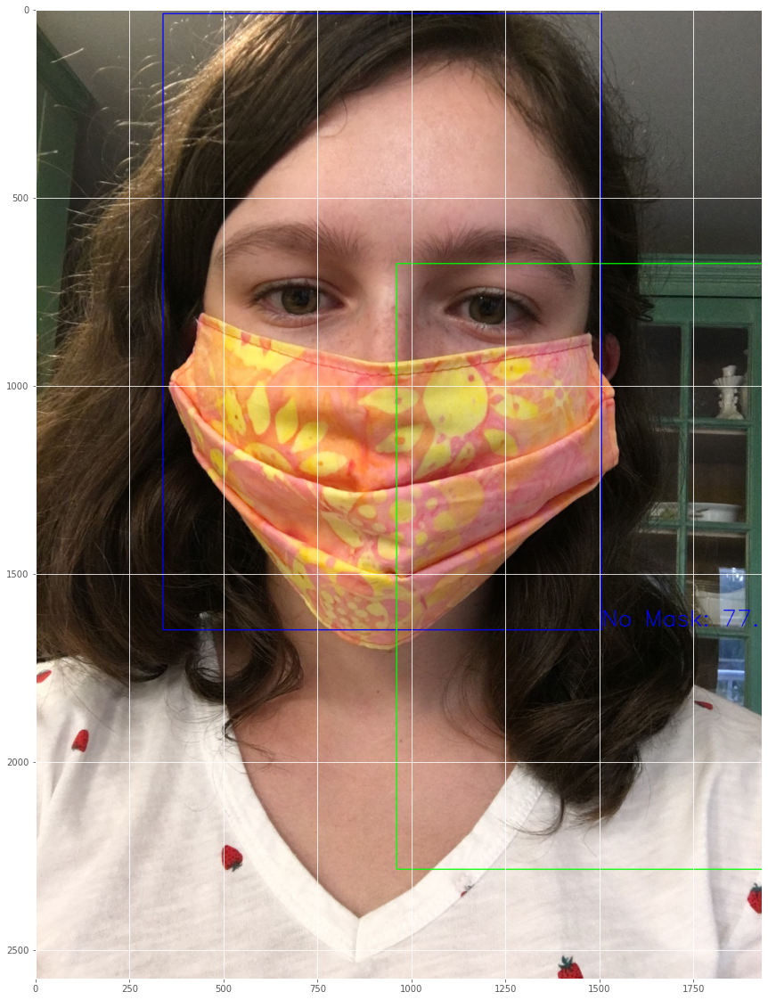

In [28]:
plt.figure(figsize=(40,20))
imgplot = plt.imshow(elizabeth_mask)
plt.show()

### Test with Daniel

#### Load Image

[INFO] computing face detections...


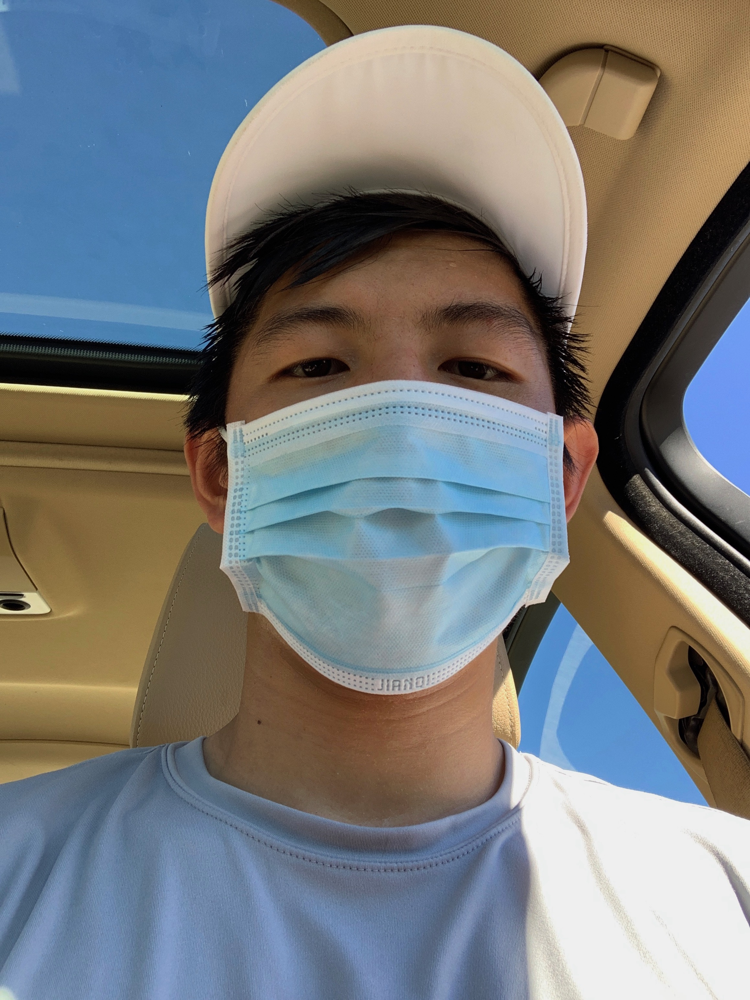

In [29]:
daniel_mask = mpimg.imread('utility/daniel_mask.jpg')
orig = daniel_mask.copy()
(h,w) = daniel_mask.shape[:2]

#construct blob from image
blob06 = cv2.dnn.blobFromImage(daniel_mask, 1.0, (300, 300),
		(104.0, 177.0, 123.0))

#pass the blob through the network
print("[INFO] computing face detections...")
net.setInput(blob06)
detections = net.forward()

Image(filename=args["input_image_daniel"], width = 600, height = 300)

#### Obtain Face Detections

In [30]:
for i in range(0, detections.shape[2]):
		# extract the confidence (i.e., probability) associated with
		# the detection
		confidence = detections[0, 0, i, 2]

		# filter out weak detections by ensuring the confidence is
		# greater than the minimum confidence
		if confidence > args["confidence"]:
			# compute the (x, y)-coordinates of the bounding box for
			# the object
			box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
			(startX, startY, endX, endY) = box.astype("int")

			# ensure the bounding boxes fall within the dimensions of
			# the frame
			(startX, startY) = (max(0, startX), max(0, startY))
			(endX, endY) = (min(w - 1, endX), min(h - 1, endY))

			# extract the face ROI, convert it from BGR to RGB channel
			# ordering, resize it to 224x224, and preprocess it
			face = daniel_mask[startY:endY, startX:endX]
			face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
			face = cv2.resize(face, (224, 224))
			face = img_to_array(face)
			face = preprocess_input(face)
			face = np.expand_dims(face, axis=0)

			# pass the face through the model to determine if the face
			# has a mask or not
			(mask, withoutMask) = model.predict(face)[0]

			# determine the class label and color we'll use to draw
			# the bounding box and text
			label = "Mask" if mask > withoutMask else "No Mask"
			color = (0, 255, 0) if label == "Mask" else (0, 0, 255)

			# include the probability in the label
			label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)

			# display the label and bounding box rectangle on the output
			# frame
			cv2.putText(daniel_mask, label, (startX, startY - 10),
				cv2.FONT_HERSHEY_SIMPLEX, 2.0, color, 2)
			cv2.rectangle(daniel_mask, (startX, startY), (endX, endY), color, 2)

#### Output

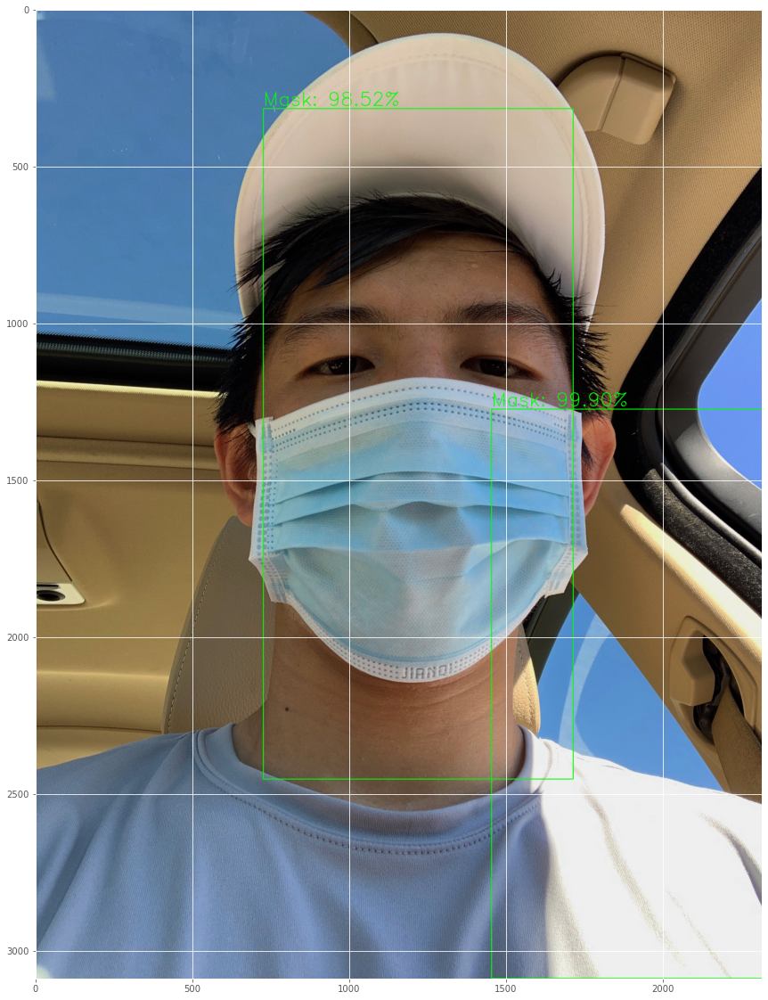

In [31]:
plt.figure(figsize=(40,20))
imgplot = plt.imshow(daniel_mask)
plt.show()

## Export the Model

In [36]:
print("[INFO] saving mask detector model...")
model.save(args["output"], save_format="h5")

[INFO] saving mask detector model...
